# 16. 흐린 사진을 선명하게
## 16-1. 들어가며
이미지를 생성하는 GAN이 효과적으로 사용되는 분야가 저해상도를 고해상도로 업스케일링하는 분야.  
특히 GAN은 CNN에 비해서 더 정밀한 고해상도 이미지를 만드는 데 효과적이다.  
고해상도 이미지를 만드는 GAN 모델을 학습하는 것은 오래 걸리기에 모델자체와 변환과정에 대해 다뤄볼 예정.

### 데이터셋 다운로드
-----------------------------------------------------------------------------------------------------------
이번 학습에 사용할 데이터셋입니다.
```
! pip install tensorflow-datasets
```

라이브러리를 불러와 데이터 다운로드
```
import tensorflow_datasets as tfds 
tfds.load("div2k/bicubic_x4")
```

### 학습 전제
-----------------------------------------------------------------------------------------------------------
  + 신경망 학습 방법에 대한 전반적인 절차를 알고 있어야 한다.
  + CNN, GAN에 대한 기본적인 개념을 알고 있어야 한다.
  + Tensorflow에서 모델을 구성할 때 사용하는 Sequential, Functional API에 대해 알고 있어야 한다.
  + Tensorflow의 GradientTape API를 이용한 학습 절차를 이해할 수 있어야 한다.
  
### 학습 목표
----------------------------------------------------------------------------------------------------------
  + Super Resolution과 그 과정 수행에 필요한 기본 개념을 이해합니다.
  + Super Resolution에 사용되는 대표적인 2개의 구조(SRCNN, SRGAN)에 대해 이해하고 활용합니다.
  
### 목차
----------------------------------------------------------------------------------------------------------
1. Super Resolution이란??
2. Super Resolution의 활용사례
3. Super Resoultion을 어렵게 만드는 요인들
4. 가장 쉬운 Super Resolution
5. Deep Learning을 이용한 Super Resolution (1) SRCNN
6. Deep Learning을 이용한 Super Resolution (2) SRCNN 이후 제안된 구조들
7. SRCNN을 이용해 Super Resolution 도전하기
8. Deep Learning을 이용한 Super Resolution 도전하기
9. SRGAN을 이용해 Super Resolution 도전하기
10. Super Resolution 결과 평가하기
11. SRCNN 및 SRGAN 결과 비교하기
12. 학습한 내용 정리하기
13. 프로젝트 : SRGAN 활용하기

## 16-2. Super Resolution이란??
오래전부터 연구해왔고, 인공지능이 활발하게 사용되는 기술인 Super Resolution에 대해 살펴보자.  

### Resolution? Super Resolution?
-----------------------------------------------------------------------------------------------------------
Super Resolution의 Resolution의 의미가 뭔지 알아보자.  
픽셀은 디스플레이를 구성하는 가장 작은 단위  
빛의 3원색을 혼합하여 색을 만드는 방식을 RGB방식이라고 한다.  
픽셀수가 많을수록 고해상도  
실제로는 해상도에 대해 이야기할때 픽셀의 수말고 픽셀의 크기도 고려해야 하지만, 오늘 학습에서는 픽셀 수만 다루기로 한다.

고해상도가 훨씬 선명하지만, 저해상도보다 용량이 크기에 버퍼링이 걸릴 수도 있다.  
이때 Super Resolution이 좋은 해결방법이 될 수 있는데, 저해상도의 영상을 받아 Super Resolution을 이용해 고해상도 영상으로 바꾸면 버퍼링없이 고해상도 영상을 즐길 수 있습니다.

## 16-3. Super Resolution의 활용 사례
  + 기존의 HD화질인 하얀거탑을 UHD 화질로 업스케일링하여 재방영한 사례
  + CCTV의 한계로 멀리 있는 물체 해상도가 낮아 인식이 불가능할 때 Super Resolution을 이용하여 인식성능 높이기.
  + X-RAY, CT의 경우 방사선으로 촬영을 하는데, 고해상도 영상을 얻기 위해서 오래 촬영을 해야 하는데, 이럴 경우 환자몸에 안 좋기에 Super Resolution을 사용한다.

## 16-4 Super Resolution을 어렵게 만드는 요인들
1. 하나의 저해상도 이미지에서 여러 개의 고해상도 이미지가 나올 수 있다.(ill-posed(inverse) problem) 일반적으로 모델을 학습시키는 과정은 고해상도이미지를 특수한 처리를 하여 저해상도 이미지를 만들고, 생성된 저해상도 이미지를 입력하면 고해상도 이미지를 복원하도록 학습.
2. Super Resolution 문제의 복잡도. 원래 이미지의 엄청난 고해상도 이미지를 만들면 기존의 제한된 픽셀 정보에서 새로운 픽셀을 만드는 과정이 매우 복잡하고 생성된 픽셀도 잘못될 수 있다.
3. Super Resolution을 통해 얻은 고해상도 이미지에 대해서 정량적인 평가와 사람의 시각적인 평가가 엇갈린다는 점.

## 16-5 가장 쉬운 Super Resolution
Super Resolution의 가장 쉬운 방식은 Interpolation을 이용.  
보간법은 알려진 값을 가진 두 점 사이 어느 지점의 값이 얼마일지 추정하는 기법.
Linear Interpolation은 2개의 점을 이용하고, Bilinear Interpolation은 4개의 값을 이용해서 새로운 픽셀 정보를 예측한다.
interpolation은 opencv를 통해 적용하고, 적용할 이미지는 scikit-image의 예제 이미지를 사용하겠습니다.
```
!pip install opencv-python
!pip install scikit-image
```

(300, 451, 3)


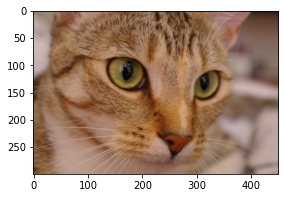

In [1]:
from skimage import data
import matplotlib.pyplot as plt

hr_image = data.chelsea() # skimage에서 제공하는 예제 이미지를 불러옵니다.
hr_shape = hr_image.shape[:2]

print(hr_image.shape) # 이미지의 크기를 출력합니다.

plt.figure(figsize=(6,3))
plt.imshow(hr_image)

불러온 고양이 픽셀이 300X451X3으로 선명해서 opencv의 resize()함수를 통해 이미지 크기를 조절해 저해상도 이미지로 만들어준다.

(100, 150, 3)


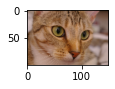

In [2]:
import cv2
lr_image = cv2.resize(hr_image, dsize=(150,100)) # (가로 픽셀 수, 세로 픽셀 수)

print(lr_image.shape)

plt.figure(figsize=(3,1))
plt.imshow(lr_image)

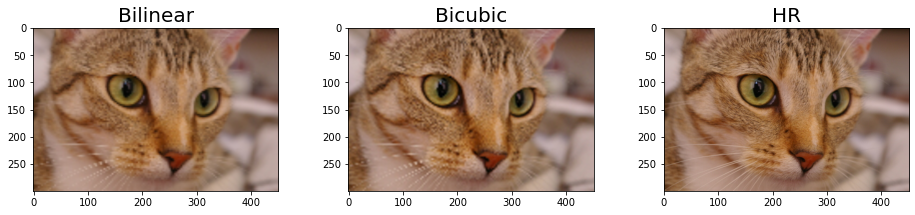

In [3]:
#resize()의 interpolation설정에 따라 적용방법 선택가능
bilinear_image = cv2.resize(
    lr_image, 
    dsize=(451, 300), # (가로 픽셀 수, 세로 픽셀 수) 
    interpolation=cv2.INTER_LINEAR # bilinear interpolation 적용
)

bicubic_image = cv2.resize(
    lr_image, 
    dsize=(451, 300), # (가로 픽셀 수, 세로 픽셀 수)
    interpolation=cv2.INTER_CUBIC # bicubic interpolation 적용
)

images = [bilinear_image, bicubic_image, hr_image]#hr이 원본
titles = ["Bilinear", "Bicubic", "HR"]

plt.figure(figsize=(16,3))
for i, (image, title) in enumerate(zip(images, titles)):
    plt.subplot(1,3,i+1)
    plt.imshow(image)
    plt.title(title, fontsize=20)

이미지가 작아서 해상도에서 큰차이가 없어 보여 만든 이미지의 특정부분을 잘라내어 시각화해보자!

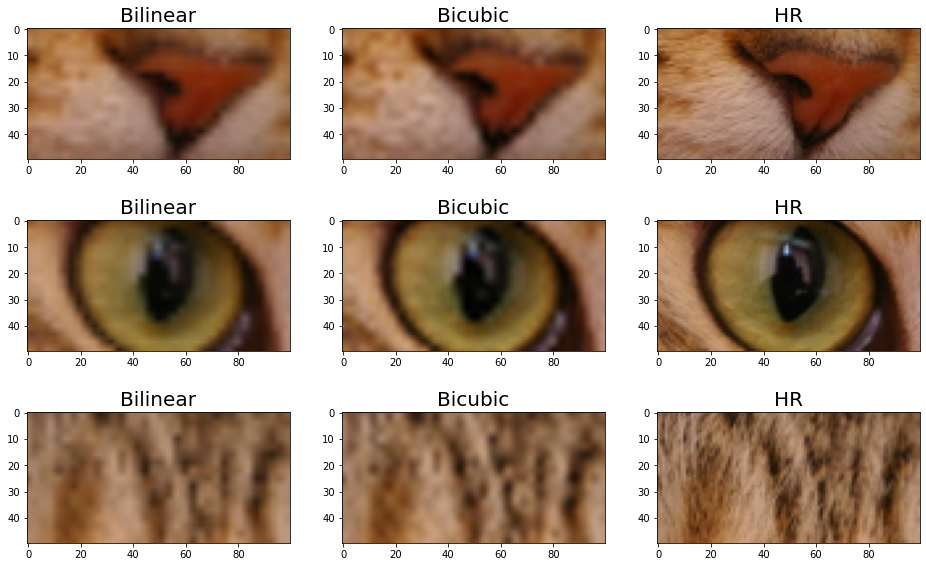

In [4]:
# 특정 영역을 잘라낼 함수를 정의합니다.
def crop(image, left_top, x=50, y=100):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]


# 잘라낼 영역의 좌표를 정의합니다.
left_tops = [(220,200)] *3 + [(90,120)] *3 + [(30,200)] *3

plt.figure(figsize=(16,10))
for i, (image, left_top, title) in enumerate(zip(images*3, left_tops, titles*3)):
    plt.subplot(3,3,i+1)
    plt.imshow(crop(image, left_top))
    plt.title(title, fontsize=20)

결과물을 보면 세밀한 정보가 없음을 확인할 수 있습니다.  
interpolation은 딥러닝 기반 Super Resolution과 결과물 비교를 위해서 수행합니다

## 16-6. DeepLearning을 이용한 Super Resolution(1) SRCNN
매우 간단한 구조임에도 기존 모델에 비해 큰 성능향상이 있었으며 딥러닝을 처음 적용한 모델로 이후에 큰 영향을 끼쳤다.  
<img src="SRCNN.png">  
저해상도 이미지(LR)을 bicubic interpolation을 통해 원하는 크기로 이미지 늘림(ILR).  
ILR을 입력받아 3개의 Convolutional layer를 거쳐 고해상도 이미지 생성.  
만든 이미지와 원본이미지사이의 차이를 역전파하여 신경망의 가중치 학습.  
  
SRCNN은 다음 3가지 연산으로 구성되어 있다.  
  1. Patch extraction and representation : 저해상도 이미지에서 patch를 추출한다.
  2. Non-linear mapping : Patch를 다른 차원의 patch로 비선형 매핑한다.
  3. Reconstruction : Patch로부터 고해상도 이미지를 생성한다.
  
사용되는 손실함수는 MSE(Mean Squared Error)

## 16-7. Deep Learning을 이용한 Super Resolution(2) SRCNN 이후에 제안된 구조들
지금 언급되는 방법들은 일반적인 CNN의 발전과정과 크게 다르지 않으며 많은 CV분야에 사용되는 방법과 유사.

### VDSR(Very Deep Super Resolution)
<img src="VDSR.png">  
SRCNN과 동일하게 저해상도 이미지를 늘려서 입력으로 사용. 대신 Convolutional layer를 20개 사용하였고, 마지막 단계에서 원본 이미지를 더하는 residual learning으로 성능향상을 이끌어냄.  
  
### RDN(Residual Dense Network)
<img src="RDN.png">  
SRCNN과 다른 점은 저해상도 이미지 그대로 입력으로 사용하며, 각 convolution layer에서 나온 특징들을 여러 번 재활용함.  

### RCAN(Residual Channel Attention Networks)
<img src="RCAN.png">  
이름에서 알 수 있듯이 Channel Attention이라 convolution layer의 결과인 특징맵을 대상으로 채널간의 모든 정보가 동일한 중요도가 아닌 일부 중요한 채널에만 선택적으로 집중하는 방식입니다.


## 16-8. SRCNN을 이용해 Super Resolution 도전하기
SRCNN을 구현, 실험.  
다운로드하던 데이터셋 준비.  
우리가 사용해볼 데이터셋은 tensorflow-datasets라이브러리의 DIV2K.
Super Resolution 연구에 쓰는 데이터셋이며 800개의 train데이터셋, 100개의 validation데이터셋으로 구성.
div2k/bicubic_x4는 고해상도 이미지를 bicubic interpolation으로 가로, 세로 픽셀수를 4분의 1로 줄인 저해상도 이미지와 원본 고해상도 이미지가 한 쌍으로 구성.  
우리가 이번에 할 것은 간단한 과정만 거치는 것이므로 실제 논문과 차이가 있다.

### 데이터 준비하기
-----------------------------------------------------------------------------------------------------------
train, valid에 각각 저해상도, 고해상도 이미지를 쌍으로 넣는다.  
그중 한쌍을 시각화.  
저해상도 이미지를 bicubic interpolation하여 고해상도와 동일한 크기로 만듬.


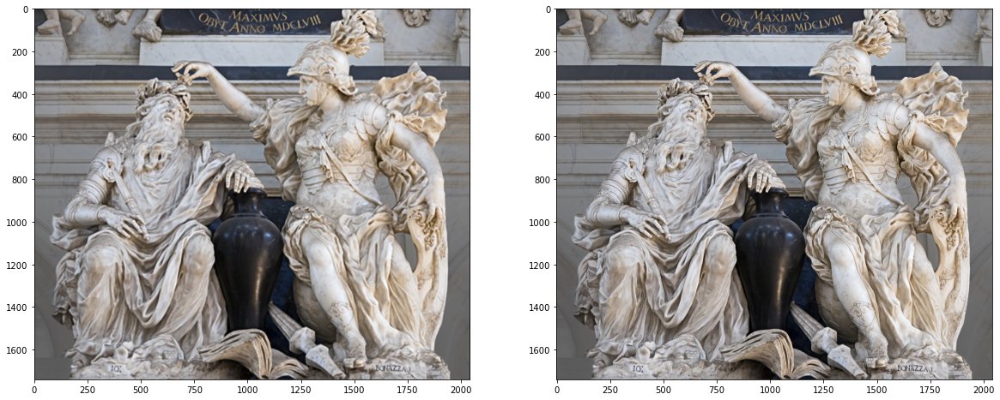

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

# 데이터를 불러옵니다.
train, valid = tfds.load(
    "div2k/bicubic_x4", 
    split=["train","validation"],
    as_supervised=True
)

# 시각화를 위해 한 개의 데이터만 선택합니다.
for i, (lr, hr) in enumerate(valid):
    if i == 6: break
    
# 저해상도 이미지를 고해상도 이미지 크기로 bicubic interpolation 합니다.  
hr, lr = np.array(hr), np.array(lr)
bicubic_hr = cv2.resize(
    lr, 
    dsize=(hr.shape[1], hr.shape[0]), # 고해상도 이미지 크기로 설정
    interpolation=cv2.INTER_CUBIC # bicubic 설정
)

# 저해상도 및 고해상도 이미지를 시각화합니다.
plt.figure(figsize=(20,10))
plt.subplot(1,2,1); plt.imshow(bicubic_hr)
plt.subplot(1,2,2); plt.imshow(hr)

이미지크기가 커서 선명함의 차이가 보이지 않아 보간으로 만든 이미지를 확대해서 확인해보자

Text(0.5, 1.0, 'HR')

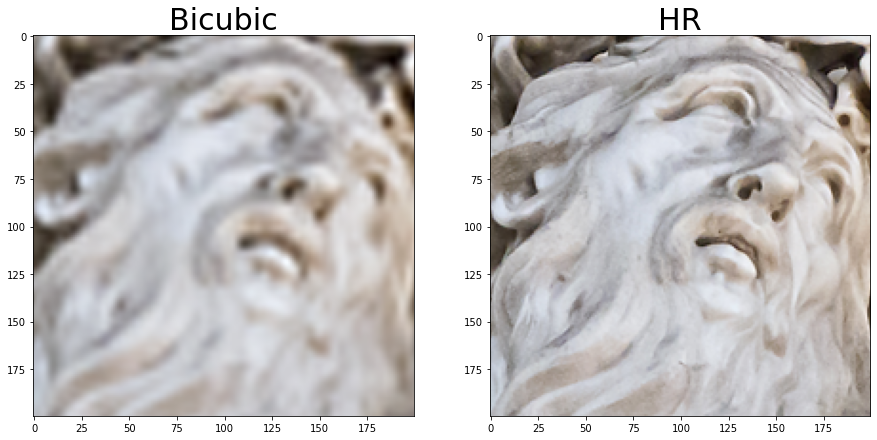

In [6]:
# 이미지의 특정 부분을 잘라내는 함수를 정의합니다.
def crop(image, left_top, x=200, y=200):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]

# interpolation된 이미지와 고해상도 이미지의 동일한 부분을 각각 잘라냅니다.
left_top = (400, 500)
crop_bicubic_hr = crop(bicubic_hr, left_top)
crop_hr = crop(hr, left_top)

# 잘라낸 부분을 시각화 합니다.
plt.figure(figsize=(15,25))
plt.subplot(1,2,1); plt.imshow(crop_bicubic_hr); plt.title("Bicubic", fontsize=30)
plt.subplot(1,2,2); plt.imshow(crop_hr); plt.title("HR", fontsize=30)

bicubic interpolation방법은 원본이미지와 비교하면 선명하지 않기에 이번에는 SRCNN을 이용해서 학습한 결과를 봅시다.  
SRCNN의 입력은 저해상도 이미지를 interpolation하여 고해상도 크기로 만든 이미지로 이 과정도 수행.  
기본 데이터자체가 크므로 데이터의 일부분만 크롭해서 학습에 적용

In [7]:
import tensorflow as tf

def preprocessing(lr, hr):
    # 이미지의 크기가 크므로 (96,96,3) 크기로 임의 영역을 잘라내어 사용합니다.
    hr = tf.image.random_crop(hr, size=[96, 96, 3])
    hr = tf.cast(hr, tf.float32) / 255.
    
    # 잘라낸 고해상도 이미지의 가로, 세로 픽셀 수를 1/4배로 줄였다가
    # interpolation을 이용해 다시 원래 크기로 되돌립니다.
    # 이렇게 만든 저해상도 이미지를 입력으로 사용합니다.
    lr = tf.image.resize(hr, [96//4, 96//4], "bicubic")
    lr = tf.image.resize(lr, [96, 96], "bicubic")
    return lr, hr

train = train.map(preprocessing).shuffle(buffer_size=10).batch(16)
valid = valid.map(preprocessing).batch(16)
print("✅")

✅


### SRCNN 구현하기
-----------------------------------------------------------------------------------------------------------
3개의 Convolution layer를 갖고 있기에 Sequential API를 활용해 구현.

In [8]:
from tensorflow.keras import layers, Sequential

# 3개의 convolutional layer를 갖는 Sequential 모델을 구성합니다.
srcnn = Sequential()
# 9x9 크기의 필터를 128개 사용합니다.
srcnn.add(layers.Conv2D(128, 9, padding="same", input_shape=(None, None, 3)))
srcnn.add(layers.ReLU())
# 5x5 크기의 필터를 64개 사용합니다.
srcnn.add(layers.Conv2D(64, 5, padding="same"))
srcnn.add(layers.ReLU())
# 5x5 크기의 필터를 64개 사용합니다.
srcnn.add(layers.Conv2D(3, 5, padding="same"))

srcnn.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, None, None, 128)   31232     
_________________________________________________________________
re_lu (ReLU)                 (None, None, None, 128)   0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 64)    204864    
_________________________________________________________________
re_lu_1 (ReLU)               (None, None, None, 64)    0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 3)     4803      
Total params: 240,899
Trainable params: 240,899
Non-trainable params: 0
_________________________________________________________________


### SRCNN 학습하기
-----------------------------------------------------------------------------------------------------------
최적화방법, 손실함수를 정하고 전처리한 데이터로 학습. 일단 1 epoch만 실행

In [9]:
srcnn.compile(
    optimizer="adam", 
    loss="mse"
)

srcnn.fit(train, validation_data=valid, epochs=1)

50/50 [==============================] - 14s 283ms/step - loss: 0.0189 - val_loss: 0.0072


### SRCNN 테스트하기
--------------------------------------------------------------------------------------------------------
SRCNN학습은 오랜시간이 걸리기에 이미 학습이 완료된 모델을 다운로드하고 불러오자.
```
$ mkdir -p ~/aiffel/super_resoluton
$ wget https://aiffelstaticprd.blob.core.windows.net/media/documents/srcnn.h5
$ mv srcnn.h5 ~/aiffel/super_resolution
```

In [10]:
import tensorflow as tf
import os

model_file = os.getenv('HOME')+'/aiffel/super_resolution/srcnn.h5'
srcnn = tf.keras.models.load_model(model_file)

In [11]:
def apply_srcnn(image):
    sr = srcnn.predict(image[np.newaxis, ...]/255.)
    sr[sr > 1] = 1
    sr[sr < 0] = 0
    sr *= 255.
    return np.array(sr[0].astype(np.uint8))

srcnn_hr = apply_srcnn(bicubic_hr)

전체영역을 다 보면 시각화가 세부적인 부분이 보이지 않기에 일부영역을 잘라서 시각적으로 비교  
비교순서는 bicubic interpolation, SRCNN, 원본

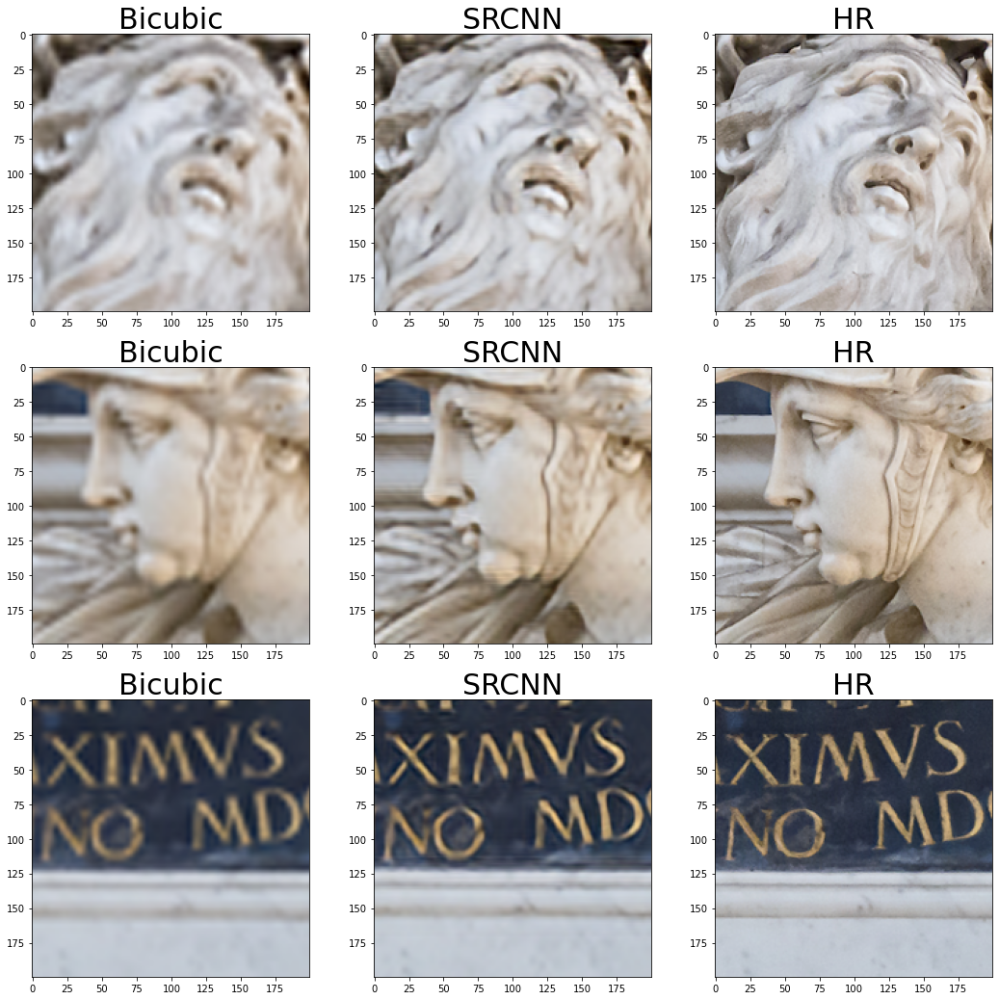

In [12]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(400,500), (300,1200), (0,1000)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr, left_top, 200, 200)
    img2 = crop(srcnn_hr , left_top, 200, 200)
    img3 = crop(hr, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRCNN", "HR"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

결과물을 보면 간단한 구조 이미지에서는 SRCNN도 충분히 만족스러운 성능을 보여주나,  
복잡한 구조 이미지에서는 아직도 만족할만한 성능이 나오지 않습니다.

## 16-9. Deep Learning을 이용한 Super Resolution(3) SRGAN

고해상도 이미즈를 만드는데 GAN이 어떻게 활용되고, 어떤 장점이 있는지 확인해보자.  

### 다시 한번,GAN  
-----------------------------------------------------------------------------------------------------------
GAN에 대해서 정리해보자.  
Q8. 위 자료에서는 데이터의 확률분포를 모델링 할 수 있다면, 무엇이 가능하다고 했나요?  
ANS) 원 데이터와 확률분포를 정확히 공유하는 무한히 많은 새로운 데이터를 새로 생성할 수 있음을 의미  
Q9. GAN의 학습이 완료되었을 때, Generator(생성자)와 Discriminator(판별자)의 출력은 무엇인가요?  
ANS) Generator의 경우 원 데이터의 확률분포를 따르는 새로운 데이터를 만들며, Discriminator의 경우 분류에 의미가 없는 0.5의 확률값을 출력한다  
Q10. 비지도학습의 의미와 일맥상통하는 물리학자 Richard Feynman 의 명언을 적어주세요.  
ANS) What I cannot create, I do not understand.  
Q11. GAN을 경찰과 위조지폐범으로 비유했을 때, 각각은 GAN 내에서 어떤 모델에 해당하는지, 각각의 목표는 무엇인지 설명해주세요  
ANS) 위조지폐범은 Generator(생성자, 생성모델)에 해당하며, 위조지폐를 잘 만들어 경찰을 속이는 게 목표다. 경찰은 Discriminator(판별자, 판별모델, 분류모델)에 해당하며, 진짜 지폐와 위조지폐를 정확히 구분하여 위조지폐범을 검거하는 것이 목표다.  
  
### SRGAN = Super Resolution + GAN  
-----------------------------------------------------------------------------------------------------------
Super Resolution에서 GAN을 많이 활용.  
SRCNN보다 복잡한 구조를 갖고 있다.  
<img src="SRGAN.png">  
Generator가 저해상도 이미지를 받아 고해상도 이미지를 생성하면 Discriminator가 진짜 고해상도 이미지와 생성된 고해상도 이미지 중에 어떤 게 진짜인지 판별한다.  
학습이 완료되면 진짜 같은 고해상도 이미지를 만들어낸다.  
SRGAN의 loss function은 아래와 같다.
<img src="SRGAN_loss_func.png">  
이미지에서의 adversarial loss는 일반적인 GAN의 loss function이며, content loss가 특별하다.  
<img src="content_loss.png">  
content loss는 만들어낸 이미지를 이미지넷으로 사전학습된 VGG모델에 입력하여 나오는 feature map의 차이를 계산.  
perceptual loss = content loss(VGG) + adversarial loss(GAN) 

## 16-10. SRGAN을 이용해 Super Resolution 도전하기  
SRCNN에서 사용한 DIV2K 데이터셋을 사용하며 논문의 실제 SRGAN과 다르게 돌림.  
### 데이터 준비하기  
-----------------------------------------------------------------------------------------------------------
SRCNN은 저해상도 이미지를 보간하여 고해상도 이미지를 만들어 입력하지만, SRGAN은 그런 과정이 필요없다.  

In [13]:
train, valid = tfds.load(
    "div2k/bicubic_x4", 
    split=["train","validation"],
    as_supervised=True
)
def preprocessing(lr, hr):
    hr = tf.cast(hr, tf.float32) /255.
        
    # 이미지의 크기가 크므로 (96,96,3) 크기로 임의 영역을 잘라내어 사용합니다.
    hr_patch = tf.image.random_crop(hr, size=[96,96,3])
        
    # 잘라낸 고해상도 이미지의 가로, 세로 픽셀 수를 1/4배로 줄입니다
    # 이렇게 만든 저해상도 이미지를 SRGAN의 입력으로 사용합니다.
    lr_patch = tf.image.resize(hr_patch, [96//4, 96//4], "bicubic")
    return lr_patch, hr_patch

train = train.map(preprocessing).shuffle(buffer_size=10).repeat().batch(8)
valid = valid.map(preprocessing).repeat().batch(8)
print("✅")

✅


### SRGAN 구현하기  
-----------------------------------------------------------------------------------------------------------
Generator(저해상도이미지 입력, 고해상도이미지 출력) 구현해보자  
<img src="SRGAN_Gen.png">  
k9n64s1은 Convolutional layer의 하이퍼파라미터 정보로 k=kernel size, n은 사용필터수, s는 stride를 의미  
Tensorflow로 구현시 Conv2D(filters=64, kernel_size=9, strides=1, padding="same")로 표현가능.
Generator에는 Skip-Connection이 있으며 Sequential API로 구현이 안되서 Functional API로 구현.


In [14]:
from tensorflow.keras import Input, Model

# 그림의 파란색 블록을 정의합니다.
def gene_base_block(x):
    out = layers.Conv2D(64, 3, 1, "same")(x)
    out = layers.BatchNormalization()(out)
    out = layers.PReLU(shared_axes=[1,2])(out)
    out = layers.Conv2D(64, 3, 1, "same")(out)
    out = layers.BatchNormalization()(out)
    return layers.Add()([x, out])

# 그림의 뒤쪽 연두색 블록을 정의합니다.
def upsample_block(x):
    out = layers.Conv2D(256, 3, 1, "same")(x)
    # 그림의 PixelShuffler 라고 쓰여진 부분을 아래와 같이 구현합니다.
    out = layers.Lambda(lambda x: tf.nn.depth_to_space(x, 2))(out)
    return layers.PReLU(shared_axes=[1,2])(out)
    
# 전체 Generator를 정의합니다.
def get_generator(input_shape=(None, None, 3)):
    inputs = Input(input_shape)
    
    out = layers.Conv2D(64, 9, 1, "same")(inputs)
    out = residual = layers.PReLU(shared_axes=[1,2])(out)
    
    for _ in range(5):
        out = gene_base_block(out)
    
    out = layers.Conv2D(64, 3, 1, "same")(out)
    out = layers.BatchNormalization()(out)
    out = layers.Add()([residual, out])
    
    for _ in range(2):
        out = upsample_block(out)
        
    out = layers.Conv2D(3, 9, 1, "same", activation="tanh")(out)
    return Model(inputs, out)

print("✅")

✅


Discriminator도 Functional API로 구현.

In [15]:
# 그림의 파란색 블록을 정의합니다.
def disc_base_block(x, n_filters=128):
    out = layers.Conv2D(n_filters, 3, 1, "same")(x)
    out = layers.BatchNormalization()(out)
    out = layers.LeakyReLU()(out)
    out = layers.Conv2D(n_filters, 3, 2, "same")(out)
    out = layers.BatchNormalization()(out)
    return layers.LeakyReLU()(out)

# 전체 Discriminator 정의합니다.
def get_discriminator(input_shape=(None, None, 3)):
    inputs = Input(input_shape)
    
    out = layers.Conv2D(64, 3, 1, "same")(inputs)
    out = layers.LeakyReLU()(out)
    out = layers.Conv2D(64, 3, 2, "same")(out)
    out = layers.BatchNormalization()(out)
    out = layers.LeakyReLU()(out)
    
    for n_filters in [128, 256, 512]:
        out = disc_base_block(out, n_filters)
    
    out = layers.Dense(1024)(out)
    out = layers.LeakyReLU()(out)
    out = layers.Dense(1, activation="sigmoid")(out)
    return Model(inputs, out)

print("✅")

✅


tensorflow의 pre-trained VGG를 불러와 content loss를 계산해보자.

In [16]:
from tensorflow.python.keras import applications
def get_feature_extractor(input_shape=(None, None, 3)):
    vgg = applications.vgg19.VGG19(
        include_top=False, 
        weights="imagenet", 
        input_shape=input_shape
    )
    # 아래 vgg.layers[20]은 vgg 내의 마지막 convolutional layer 입니다.
    return Model(vgg.input, vgg.layers[20].output)

print("✅")

✅


### SRGAN 학습하기
-----------------------------------------------------------------------------------------------------------
SRCNN과 마찬가지로 SRGAN도 Epoch를 줄여서 학습시켜보자

In [17]:
from tensorflow.keras import losses, metrics, optimizers

generator = get_generator()
discriminator = get_discriminator()
vgg = get_feature_extractor()

# 사용할 loss function 및 optimizer 를 정의합니다.
bce = losses.BinaryCrossentropy(from_logits=False)
mse = losses.MeanSquaredError()
gene_opt = optimizers.Adam()
disc_opt = optimizers.Adam()

def get_gene_loss(fake_out):
    return bce(tf.ones_like(fake_out), fake_out)

def get_disc_loss(real_out, fake_out):
    return bce(tf.ones_like(real_out), real_out) + bce(tf.zeros_like(fake_out), fake_out)


@tf.function
def get_content_loss(hr_real, hr_fake):
    hr_real = applications.vgg19.preprocess_input(hr_real)
    hr_fake = applications.vgg19.preprocess_input(hr_fake)
    
    hr_real_feature = vgg(hr_real) / 12.75
    hr_fake_feature = vgg(hr_fake) / 12.75
    return mse(hr_real_feature, hr_fake_feature)


@tf.function
def step(lr, hr_real):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        hr_fake = generator(lr, training=True)
        
        real_out = discriminator(hr_real, training=True)
        fake_out = discriminator(hr_fake, training=True)
        
        perceptual_loss = get_content_loss(hr_real, hr_fake) + 1e-3 * get_gene_loss(fake_out)
        discriminator_loss = get_disc_loss(real_out, fake_out)
        
    gene_gradient = gene_tape.gradient(perceptual_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(discriminator_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return perceptual_loss, discriminator_loss


gene_losses = metrics.Mean()
disc_losses = metrics.Mean()

for epoch in range(1, 2):
    for i, (lr, hr) in enumerate(train):
        g_loss, d_loss = step(lr, hr)
        
        gene_losses.update_state(g_loss)
        disc_losses.update_state(d_loss)
        
        # 10회 반복마다 loss를 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \nGenerator_loss:{gene_losses.result():.4f} \nDiscriminator_loss:{disc_losses.result():.4f}", end="\n\n")
        
        if (i+1) == 200:
            break
            
    gene_losses.reset_states()
    disc_losses.reset_states()

EPOCH[1] - STEP[10] 
Generator_loss:0.0011 
Discriminator_loss:2.0695

EPOCH[1] - STEP[20] 
Generator_loss:0.0010 
Discriminator_loss:1.6976

EPOCH[1] - STEP[30] 
Generator_loss:0.0009 
Discriminator_loss:1.5268

EPOCH[1] - STEP[40] 
Generator_loss:0.0010 
Discriminator_loss:1.4686

EPOCH[1] - STEP[50] 
Generator_loss:0.0011 
Discriminator_loss:1.3208

EPOCH[1] - STEP[60] 
Generator_loss:0.0013 
Discriminator_loss:1.1485

EPOCH[1] - STEP[70] 
Generator_loss:0.0017 
Discriminator_loss:1.0072

EPOCH[1] - STEP[80] 
Generator_loss:0.0020 
Discriminator_loss:0.8894

EPOCH[1] - STEP[90] 
Generator_loss:0.0025 
Discriminator_loss:0.7925

EPOCH[1] - STEP[100] 
Generator_loss:0.0029 
Discriminator_loss:0.7139

EPOCH[1] - STEP[110] 
Generator_loss:0.0033 
Discriminator_loss:0.6506

EPOCH[1] - STEP[120] 
Generator_loss:0.0034 
Discriminator_loss:0.6103

EPOCH[1] - STEP[130] 
Generator_loss:0.0035 
Discriminator_loss:0.5666

EPOCH[1] - STEP[140] 
Generator_loss:0.0036 
Discriminator_loss:0.5286

E

### SRGAN 테스트하기
-----------------------------------------------------------------------------------------------------------
학습하는 데 오랜 시간이 필요하기에 미리 학습된 것을 불러와 테스트해보자  
지금은 Generator만 불러와보자
```
$ wget https://aiffelstaticprd.blob.core.windows.net/media/documents/srgan_G.h5
$ mv srgan_G.h5 ~/aiffel/super_resolution
```

In [42]:
import tensorflow as tf
import os

model_file = os.getenv('HOME')+'/aiffel/super_resolution/srgan_G.h5'
srgan = tf.keras.models.load_model(model_file, compile=False)  
optimizer = tf.keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)

srgan.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [43]:
# 테스트하는 함수.
def apply_srgan(image):
    image = tf.cast(image[np.newaxis, ...], tf.float32)
    sr = srgan.predict(image)
    sr = tf.clip_by_value(sr, 0, 255)
    sr = tf.round(sr)
    sr = tf.cast(sr, tf.uint8)
    return np.array(sr)[0]

train, valid = tfds.load(
    "div2k/bicubic_x4", 
    split=["train","validation"],
    as_supervised=True
)

for i, (lr, hr) in enumerate(valid):
    if i == 6: break

srgan_hr = apply_srgan(lr)
print("✅")

✅


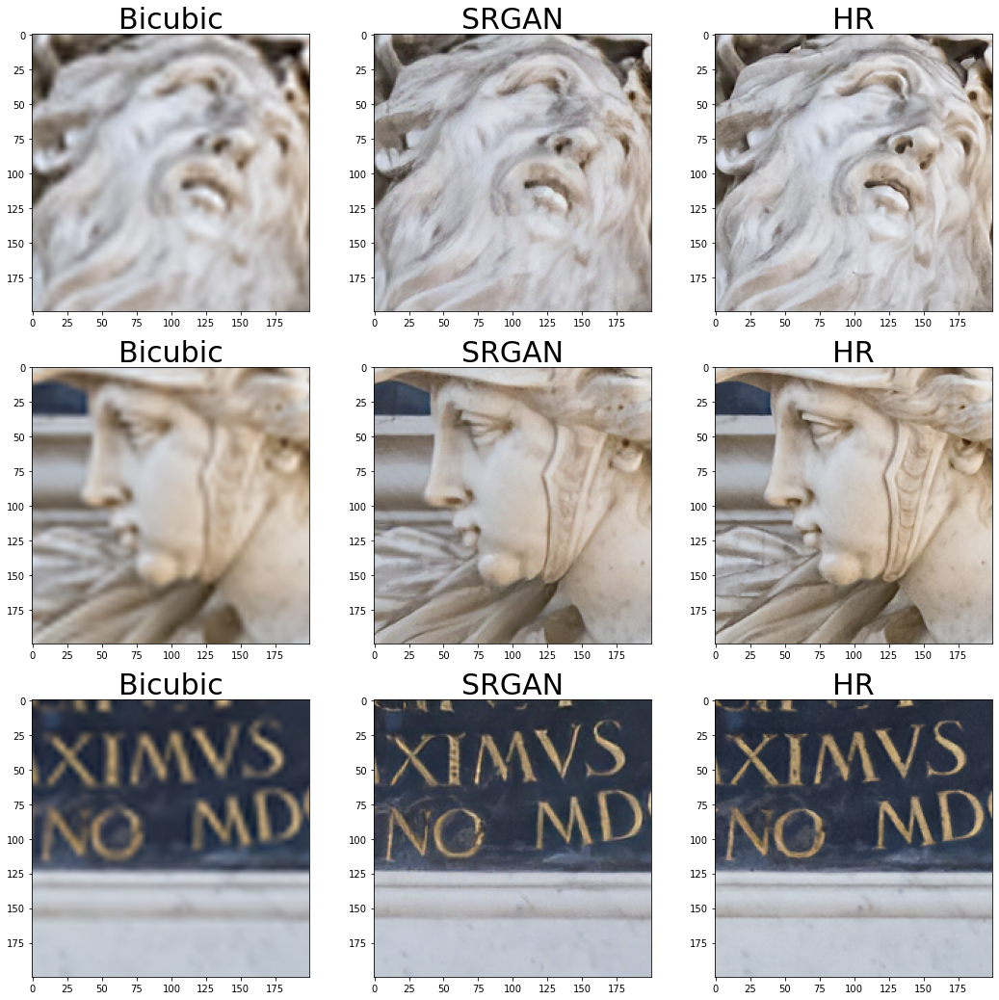

In [44]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(400,500), (300,1200), (0,1000)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr, left_top, 200, 200)
    img2 = crop(srgan_hr , left_top, 200, 200)
    img3 = crop(hr, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRGAN", "HR"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

결과순서가 Bicubic, SRGAN, 원본인데, SRGAN이 고해상도에 가까운 이미지를 뽑아냈습니다.  
오른쪽으로 갈수록 더 세세해집니다.
<img src="SRGAN발전.png">

## 16-11. Super Resolution 결과 평가하기  
연구에서 사용되는 정량적인 평가 척도가 몇가지 있는데, 알아보고 앞서 SRCNN, SRGAN으로 만든 이미지를 평가해보자.  
  
### PSNR과 SSIM  
-----------------------------------------------------------------------------------------------------------
PSNR(Peak Signal-to-Noise Ratio)는 영상 내 신호가 가질 수 있는 초대 신호에 대한 잡음의 비율을 나타낸다.  
영상이 압축되었을 때 화질이 얼마나 손상되었는지 평가할때 사용하며, 데시벨(db)단위로 사용. 값이 높을 수록 손실이 적다는 뜻.  
SSIM(Structural Similarity Index Map)은 영상 구조 정보를 고려하여 얼마나 구조 정보가 변화시키지 않았는지 계산  
값이 높을 수록 원본영상에 가깝다는 뜻.  
둘다 scikit-image 라이브러리로 계산 가능.  
[SSIM](https://bskyvision.com/396)  
[PSNR](https://bskyvision.com/392)  

(300, 451, 3)


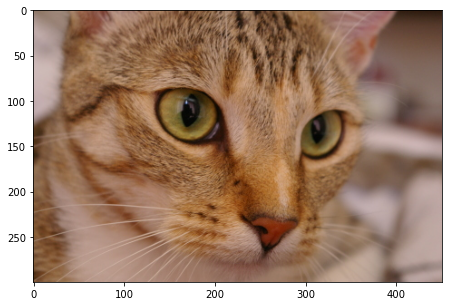

In [45]:
from skimage import data
import matplotlib.pyplot as plt

hr_cat = data.chelsea() # skimage에서 제공하는 예제 이미지를 불러옵니다.
hr_shape = hr_cat.shape[:2]

print(hr_cat.shape) # 이미지의 크기를 출력합니다.

plt.figure(figsize=(8,5))
plt.imshow(hr_cat)

In [46]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

print("**동일 이미지 비교**")
print("PSNR :", peak_signal_noise_ratio(hr_cat, hr_cat)) # PSNR계산
print("SSIM :", structural_similarity(hr_cat, hr_cat, multichannel=True)) # SSIM계산

**동일 이미지 비교**
PSNR : inf
SSIM : 1.0


PSNR은 양의 무한대가 가능하고, SSIM은 0~1사이의 값을 가진다.  
픽셀수를 줄이고 Bicubic으로 보간하고 계산해보자.  
픽셀을 줄일때마다 점수가 떨어진다.

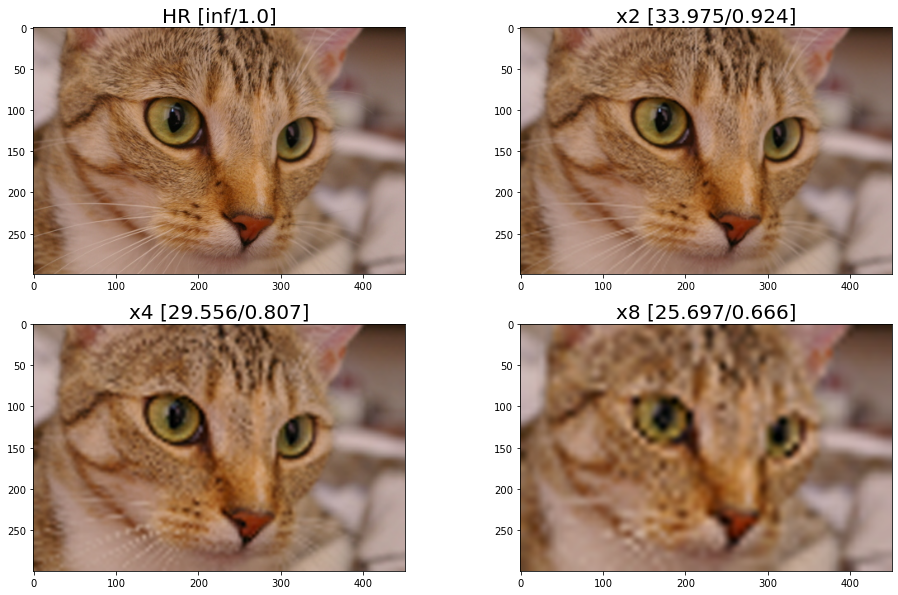

In [47]:
import cv2

# 이미지를 특정 크기로 줄이고 다시 늘리는 과정을 함수로 정의합니다.
def interpolation_xn(image, n):
    downsample = cv2.resize(
        image,
        dsize=(hr_shape[1]//n, hr_shape[0]//n)
    )
    upsample = cv2.resize(
        downsample,
        dsize=(hr_shape[1], hr_shape[0]),
        interpolation=cv2.INTER_CUBIC
    )
    return upsample

lr2_cat = interpolation_xn(hr_cat, 2) # 1/2로 줄이고 다시 복원
lr4_cat = interpolation_xn(hr_cat, 4) # 1/4로 줄이고 다시 복원
lr8_cat = interpolation_xn(hr_cat, 8) # 1/8로 줄이고 다시 복원

images = [hr_cat, lr2_cat, lr4_cat, lr8_cat]
titles = ["HR", "x2", "x4", "x8"]

# 각 이미지에 대해 PSNR을 계산하고 반올림합니다.
psnr = [round(peak_signal_noise_ratio(hr_cat, i), 3) for i in images]
# 각 이미지에 대해 SSIM을 계산하고 반올림합니다.
ssim = [round(structural_similarity(hr_cat, i, multichannel=True), 3) for i in images]

# 이미지 제목에 PSNR과 SSIM을 포함하여 시각화 합니다. 
plt.figure(figsize=(16,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=20)

## 16-12. SRCNN 및 SRGAN 결과 비교하기  
SRCNN, SRGAN으로 만든 결과를 시각적으로 비교해보자  
DIV2K 데이터셋의 검증용 데이터를 갖고와 돌려보고 특정부분을 잘라내서 비교해보자

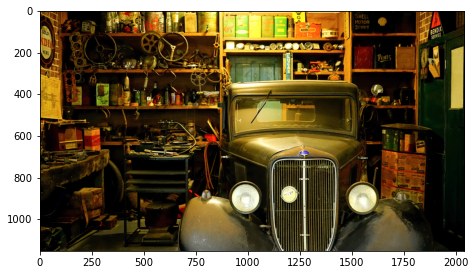

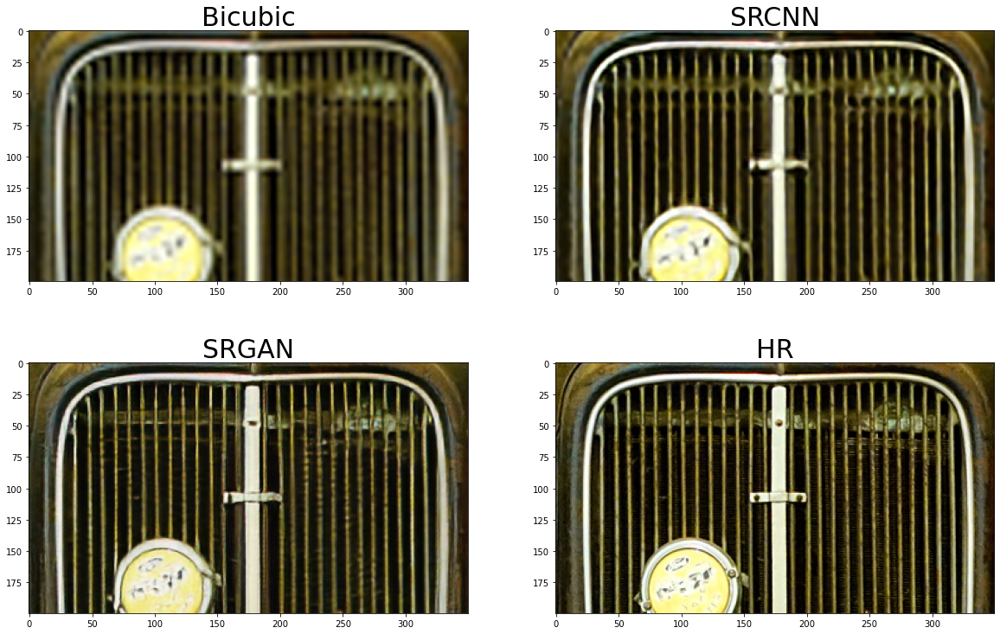

In [48]:
for i, (lr, hr) in enumerate(valid):
    if i == 12: break # 12번째 이미지를 불러옵니다.

lr_img, hr_img = np.array(lr), np.array(hr)

# bicubic interpolation
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

# 전체 이미지를 시각화합니다.
plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

# SRCNN을 이용해 고해상도로 변환합니다.
srcnn_img = apply_srcnn(bicubic_img)

# SRGAN을 이용해 고해상도로 변환합니다.
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

left_top = (700, 1090) # 잘라낼 부분의 왼쪽 상단 좌표를 지정합니다.

# bicubic, SRCNN, SRGAN 을 적용한 이미지와 원래의 고해상도 이미지를 시각화합니다.
plt.figure(figsize=(20,20))
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

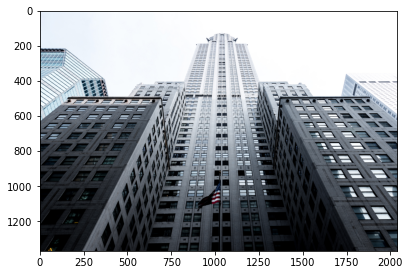

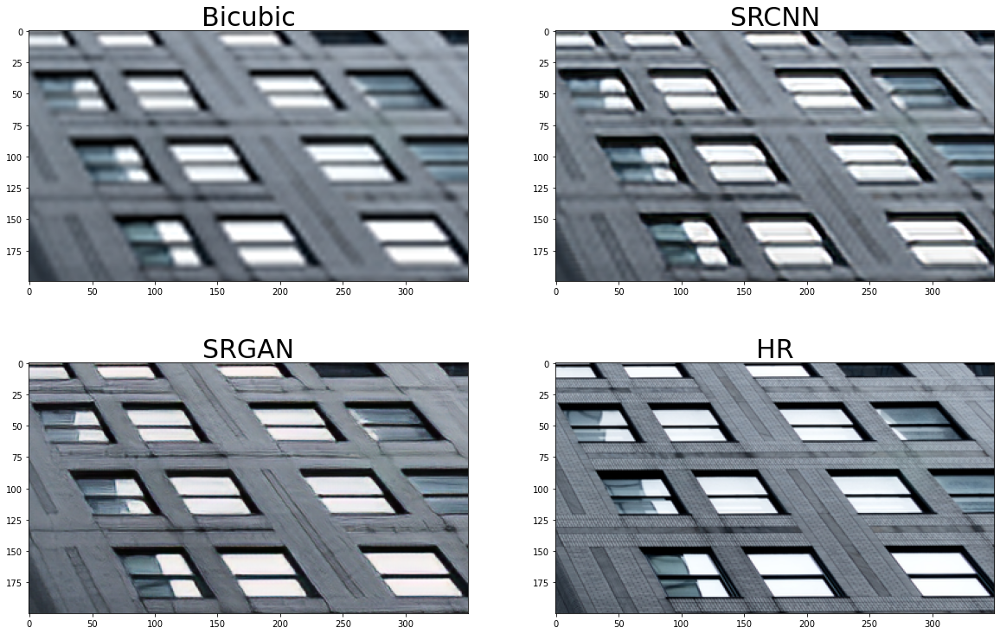

In [49]:
for i, (lr, hr) in enumerate(valid):
    if i == 15: break

lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

left_top = (600, 1500)

plt.figure(figsize=(20,20))
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

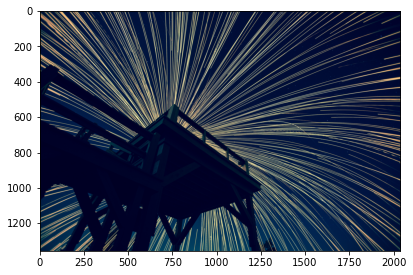

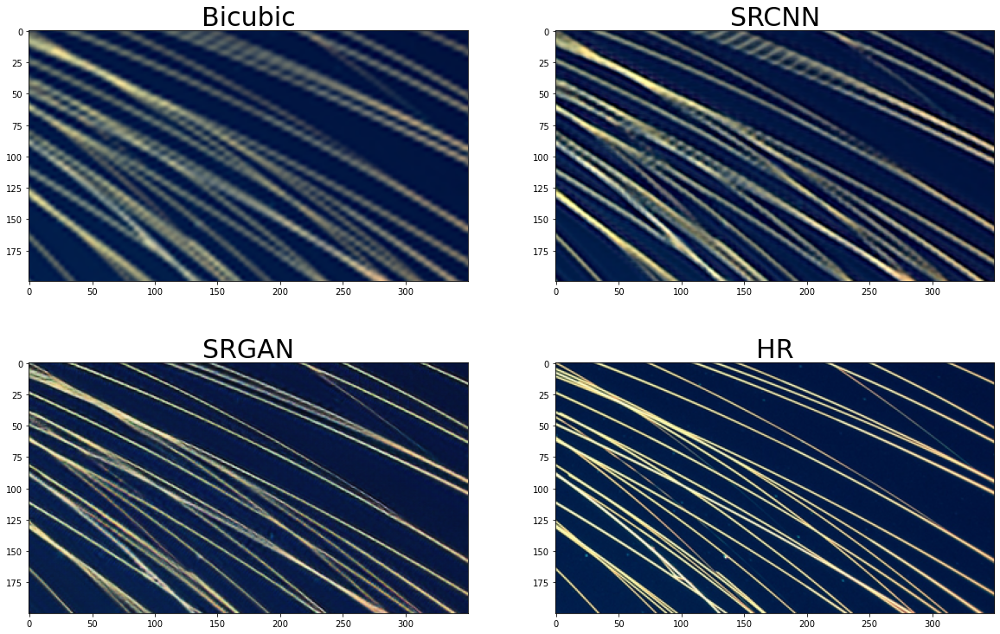

In [50]:
for i, (lr, hr) in enumerate(valid):
    if i == 8: break

lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

left_top = (900, 1500)

plt.figure(figsize=(20,20))
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

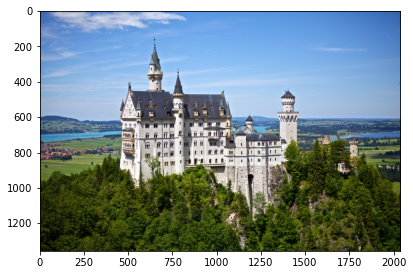

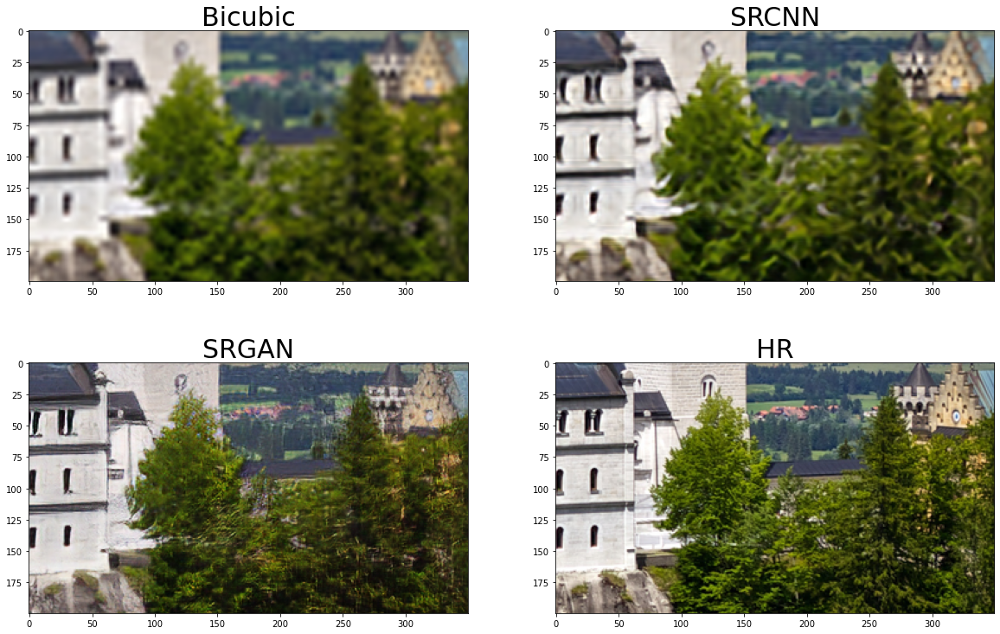

In [51]:
for i, (lr, hr) in enumerate(valid):
    if i == 24: break

lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

left_top = (700, 1300)

plt.figure(figsize=(20,20))
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

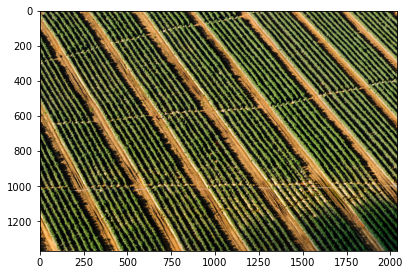

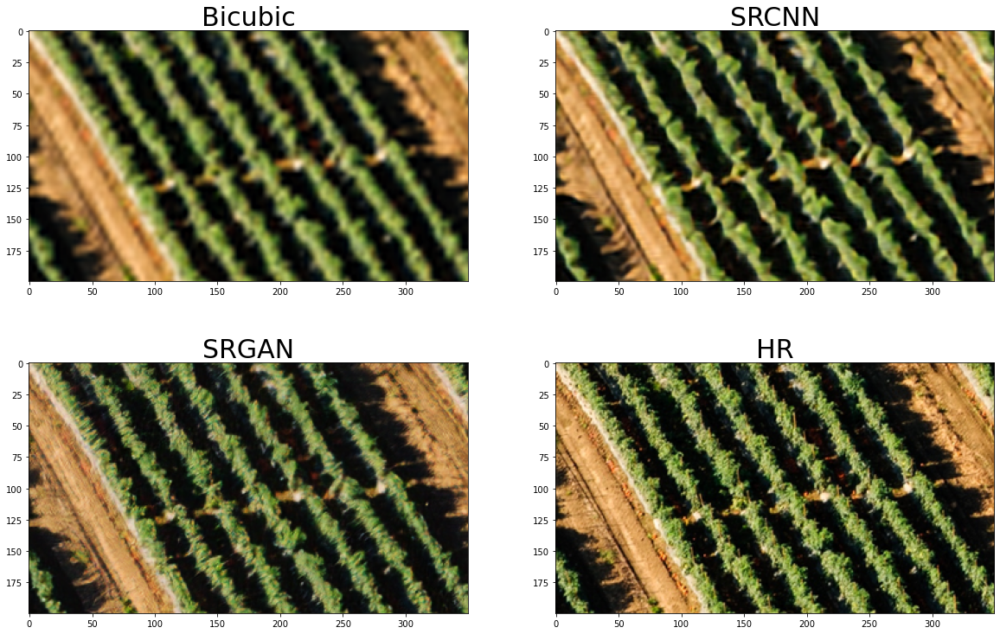

In [52]:
for i, (lr, hr) in enumerate(valid):
    # 불러올 이미지의 인덱스를 지정합니다.
    # 위에서 시각화 했던 8, 12, 15, 24 번을 제외한 다른 숫자를 넣어봅시다 
    if i == 54 : 
        break          

lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

# 잘라낼 부분의 왼쪽 상단 좌표를 지정합니다.
left_top = (500, 300)

plt.figure(figsize=(20,20)) # 이미지 크기를 조절할 수 있습니다.
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    # crop 함수 내의 세번째 네번째 인자를 수정해 이미지 크기를 조절합니다.
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

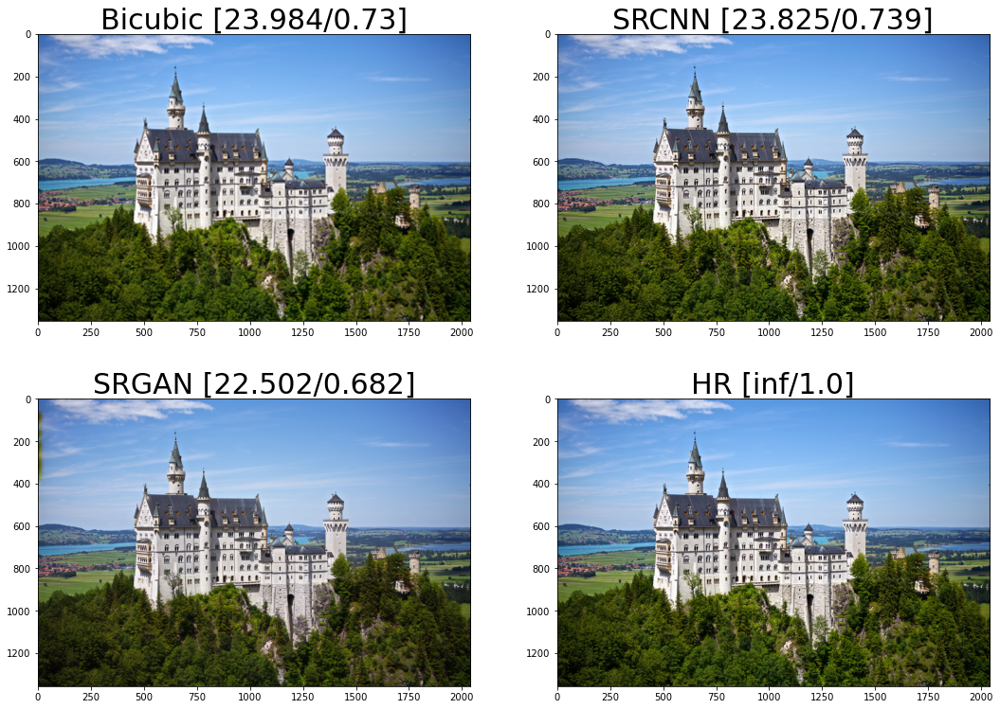

In [53]:
for i, (lr, hr) in enumerate(valid):
    if i == 24: break
    
lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img,
    (hr.shape[1], hr.shape[0]),
    interpolation=cv2.INTER_CUBIC
)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

# 각 이미지에 대해 PSNR을 계산하고 반올림합니다.
psnr = [round(peak_signal_noise_ratio(hr_img, i), 3) for i in images]
# 각 이미지에 대해 SSIM을 계산하고 반올림합니다.
ssim = [round(structural_similarity(hr_img, i, multichannel=True), 3) for i in images]

# 이미지 제목에 PSNR과 SSIM을 포함하여 시각화 합니다. 
plt.figure(figsize=(18,13))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=30)

결과를 보면 SRGAN의 값이 낮다.  
건물창문을 잘라 자세히 보자

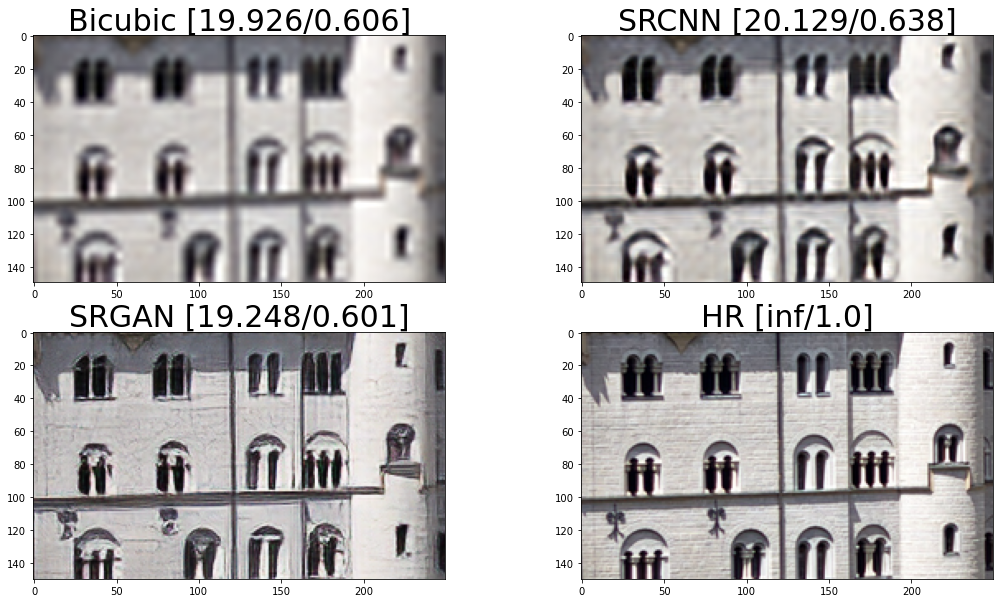

In [54]:
left_top = (620, 570)
crop_images = [crop(i, left_top, 150, 250) for i in images]

psnr = [round(peak_signal_noise_ratio(crop_images[-1], i), 3) for i in crop_images]
ssim = [round(structural_similarity(crop_images[-1], i, multichannel=True), 3) for i in crop_images]

plt.figure(figsize=(18,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(crop_images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=30)

SRCNN은 고해상도에 비해 흐릿하다.  
학습에 MSE를 사용했기에 단순히 평균을 잘 맞추는 방향으로 예측해서 그렇다.  
SRGAN은 선명하지만 이상함을 알 수 있다. GAN+VGG이므로 사실적이긴 하지만, 저해상도 이미지의 정보량이 적기에 세부적으로 동일하지는 않다. 

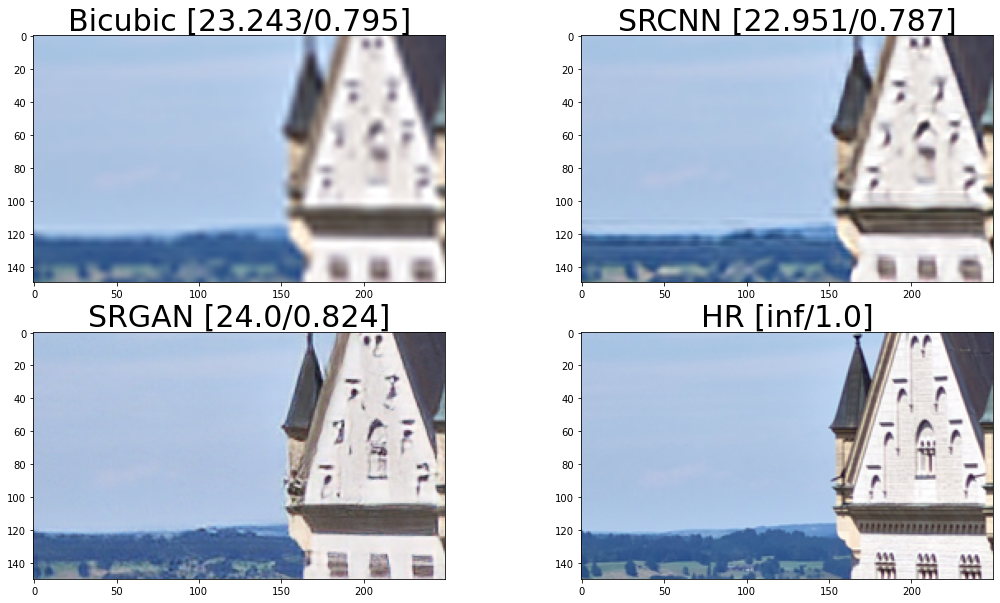

In [55]:
for i, (lr, hr) in enumerate(valid):
    # 불러올 이미지의 인덱스를 지정합니다.
    # 위에서 시각화 했던 8, 12, 15, 24 번을 제외한 다른 숫자를 넣어봅시다 
    if i == 54 : 
        break          

lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img,
    (hr.shape[1], hr.shape[0]),
    interpolation=cv2.INTER_CUBIC
)

# 확대할 부분의 왼쪽 상단 좌표를 지정합니다.
left_top = (500, 300)

# crop 함수 내의 세번째 네번째 인자를 수정해 이미지 크기를 조절합니다.
crop_images = [crop(i, left_top, 150, 250) for i in images] 
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

psnr = [round(peak_signal_noise_ratio(crop_images[-1], i), 3) for i in crop_images]
ssim = [round(structural_similarity(crop_images[-1], i, multichannel=True), 3) for i in crop_images]

plt.figure(figsize=(18,10)) # 이미지 크기를 조절할 수 있습니다.
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(crop_images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=30)

## 16-13. 학습한 내용 정리하기  
Super Resolution이 무엇이고, 어떻게 활용되는지, 어떤 딥러닝 기반의 연구가 있었는지 확인해봤다.  
추가적인 정보를 좀더 알아보자  
### 다른 이미지를 참고한다면  
-----------------------------------------------------------------------------------------------------------
지금까지 해온 방식은 SISR(Single Image Super Resolution)에 속한다.  
한 장의 저해상도 이미지를 이용해서 고해상도 이미지를 생성해왔는데, 여러 장의 저해상도 이미지를 이용하면 더 좋지 않을까?  
RefSR(Reference-based Super Resolution)은 해상도를 높이는데, 참고할 만한 이미지를 같이 제공하는 방식.  
Ref images로 두 이미지를 입력으로 SR을 적용하면 SRNTT라고 적힌 결과가 나오는데, 더 선명하다.
<img src="RefSR.png">  
### 차별을 재생성하는 인공지능
-----------------------------------------------------------------------------------------------------------
인공지능이 가진 문제 중 하나가 차별.  
학습에 사용하는 데이터가 편향을 담고 있다면, 모델도 자연스럽게 차별을 하게 된다.  
<img src="gun.png">  
<img src="face.png">  
데이터가 백인으로 편향되어 흑인, 동양인이 백인으로 재구성됨을 볼 수 있다.  
[공정한 AI 얼굴 인식기](https://www.kakaobrain.com/blog/57)  

### 학습한 내용 정리하기
-----------------------------------------------------------------------------------------------------------
Q12. 저해상도 이미지를 고해상도로 복원할 때, 고해상도 이미지의 정답이 여러 개 존재할 수 있는데 이러한 문제를 무엇이라고 하나요?  
ANS) Regular Inverse Problem(Ill-Posed Problem)  
Q13. Interpolation을 활용해 Super Resolution을 할 때 사용할 수 있는 방법 2가지만 적어주세요.  
ANS) Bicubic, Bilinear, Lanczos interpolation  
Q14. SRCNN과 VDSR은 각각 몇 개의 convolutional layer를 사용하나요?  
ANS) 3, 20  
Q15. GAN을 이용한 Super Resolution에서 Generator의 역할은 무엇인가요?  
저해상도 이미지를 입력받아 고해상도 이미지 출력  
Q16. 참고 자료에서 SRGAN의 Perceptual Loss를 구성하는 두 가지 loss는 무엇이라고 했나요?  
ANS) GAN Loss, VGG Loss  
Q17. 많은 Super Resolution 논문에서 사용하는 두 가지 정량적 성능 지표는 무엇인가요?  
ANS) PSNR, SSIM  
### 추가 학습 자료
-----------------------------------------------------------------------------------------------------------
[SRCNN](https://www.youtube.com/watch?v=1jGr_OFyfa0)  
[SRGAN](https://www.youtube.com/watch?v=nGPMKnoJTcI)  
[EDSR](https://www.youtube.com/watch?v=OMIqkn2DCUk)  
[SR](https://www.youtube.com/watch?v=nvsYKSHw0jo)

## 16-14. 프로젝트:SRGAN 활용하기
### 프로젝트 1: 직접 고른 이미지로 SRGAN실험하기
-----------------------------------------------------------------------------------------------------------
이제 여러분이 직접 다른 이미지를 사용해 볼 차례입니다.

앞서 사용했던 DIV2K 데이터셋은 bicubic interpolation을 이용해 가로 및 세로 픽셀 수를 1/4로 줄인 저해상도 이미지와 원래 고해상도 이미지 사이에서 학습되었습니다. 이 데이터셋으로 학습된 SRGAN를 이용해 좋은 결과를 얻기 위해서는 위와 같은 과정이 동일하게 진행되는 것이 좋습니다.

아래와 같이 두 가지 다른 단계를 거쳐서 직접 고른 이미지에 대해 SRGAN을 적용해 봅시다. (모델 학습을 진행하는 건 아닙니다❗) 테스트할 이미지를 고를 때, DIV2K 의 학습 데이터셋과 비슷한 종류의 이미지가 좋습니다. 일반적으로 자연, 동물, 건물 등의 이미지가 학습에 사용되었으며, 이와 달리 애니메이션 등의 이미지는 고해상도로 잘 변환되지 않을 수 있습니다.

특정 데이터셋에서만 학습되었기 때문에, 일반적으로 좋지 않은 결과가 나올 가능성이 높습니다. 결과와 상관없이 아래 과정만 잘 수행해봅시다.

#### 프로젝트 1-1.

  1. (적당히) 높은 해상도를 가진 이미지를 검색해서 한 장 고른 후 저장하고 불러옵니다.
  2. 불러온 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 1/4로 줄입니다. cv2.resize()를 사용해 봅시다.
  3. 줄인 저해상도 이미지를 입력으로 SRGAN을 이용해 고해상도 이미지를 생성합니다. 이전에 사용한 apply_srgan 함수를 사용하면 쉽습니다.
  4. 2.의 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 다시 4배로 늘립니다. 마찬가지로 cv2.resize()를 사용해 봅시다.
  5. 3개 이미지(4.의 Bicubic의 결과, 3.의 SRGAN의 결과, 1.의 원래 고해상도 이미지)를 나란히 시각화합니다. 각 이미지의 제목에 어떤 방법에 대한 결과인지 표시해 주세요. 이전 시각화에 사용했던 코드를 참고하면 어렵지 않습니다.
  6. 선택한 이미지를 DIV2K 데이터셋에서 학습된 모델로 Super Resolution했을 때 어떠한 결과가 나왔으며, 왜 이러한 결과가 출력되었는지 설명해 봅시다. (정답은 없습니다) 

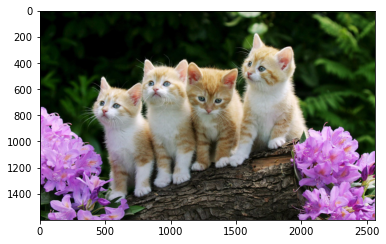

In [75]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
image_cat = mpimg.imread('cat.jpg')
plt.imshow(image_cat)

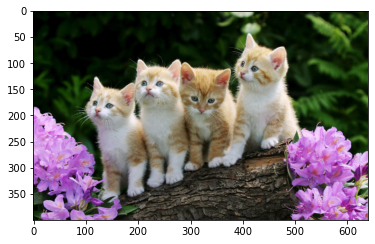

In [76]:
import cv2
bicubic_image = cv2.resize(
    image_cat, 
    dsize=(640, 400), # (가로 픽셀 수, 세로 픽셀 수)
    interpolation=cv2.INTER_CUBIC # bicubic interpolation 적용
)
plt.imshow(bicubic_image)

In [63]:
# 테스트하는 함수.
srgan_image = apply_srgan(bicubic_image)
print("✅")

✅


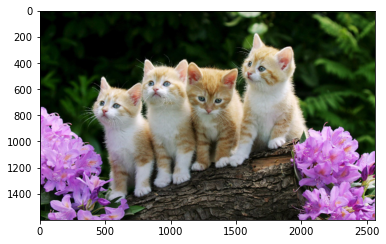

In [77]:
import cv2
bicubic_image = cv2.resize(
    bicubic_image, 
    dsize=(2560, 1600), # (가로 픽셀 수, 세로 픽셀 수)
    interpolation=cv2.INTER_CUBIC # bicubic interpolation 적용
)
plt.imshow(bicubic_image)

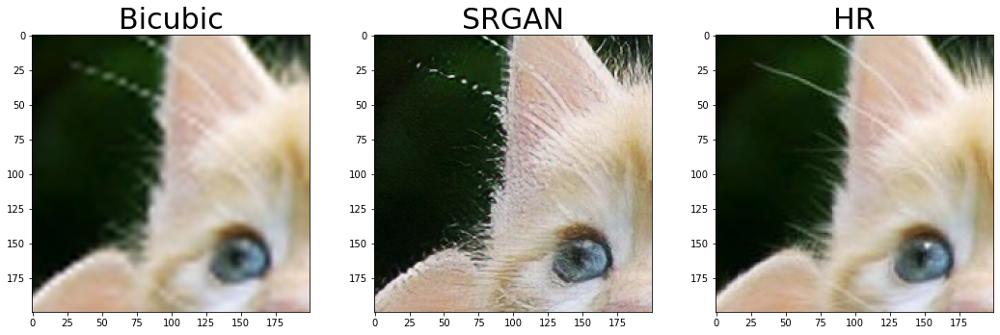

In [78]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_top = (400,700)

images = []

img1 = crop(bicubic_image, left_top, 200, 200)
img2 = crop(srgan_image , left_top, 200, 200)
img3 = crop(image_cat, left_top, 200, 200)
images.extend([img1, img2, img3])

labels = ["Bicubic", "SRGAN", "HR"]

plt.figure(figsize=(18,18))
for i in range(3):
    plt.subplot(3,3,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

선택한 이미지를 DIV2K 데이터셋에서 학습된 모델로 Super Resolution했을 때 어떠한 결과가 나왔으며, 왜 이러한 결과가 출력되었는지 설명해 봅시다. (정답은 없습니다)  
ANS) 저해상도 이미지의 정보량이 적기에 선명하지만, 만들어낸 사진이 이상함을 알 수 있다(털이 끊기고, 미세한 털의 질감이 망가짐)

#### 프로젝트 1-2.

  1. (적당히) 낮은 해상도를 가진 이미지를 검색해서 한 장 고른 후 저장하고 불러옵니다.
  2. 불러온 이미지를 입력으로 SRGAN을 이용해 고해상도 이미지를 생성합니다. 이전에 사용한 apply_srgan 함수를 사용하면 쉽습니다.
  3. 1.에서 불러온 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 다시 4배로 늘립니다. cv2.resize()를 사용해 봅시다.
  4. 2개 이미지(3.의 Bicubic의 결과, 2.의 SRGAN의 결과)를 나란히 시각화합니다. 각 이미지의 제목에 어떤 방법에 대한 결과인지 표시해 주세요. 이전 시각화에 사용했던 코드를 참고하면 어렵지 않습니다.
  5. 선택한 이미지를 DIV2K 데이터셋에서 학습된 모델로 Super Resolution했을 때 어떠한 결과가 나왔으며, 왜 이러한 결과가 출력되었는지 설명해 봅시다. (정답은 없습니다)  

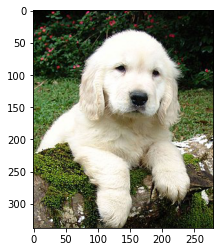

In [81]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
image_dog = mpimg.imread('dog.jpg')
plt.imshow(image_dog)

In [82]:
srgan_image = apply_srgan(image_dog)
print("✅")

✅


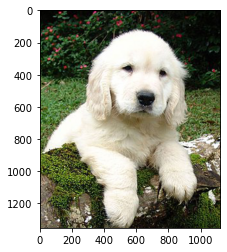

In [83]:
import cv2
bicubic_image = cv2.resize(
    image_dog, 
    dsize=(1120, 1352), # (가로 픽셀 수, 세로 픽셀 수)
    interpolation=cv2.INTER_CUBIC # bicubic interpolation 적용
)
plt.imshow(bicubic_image)

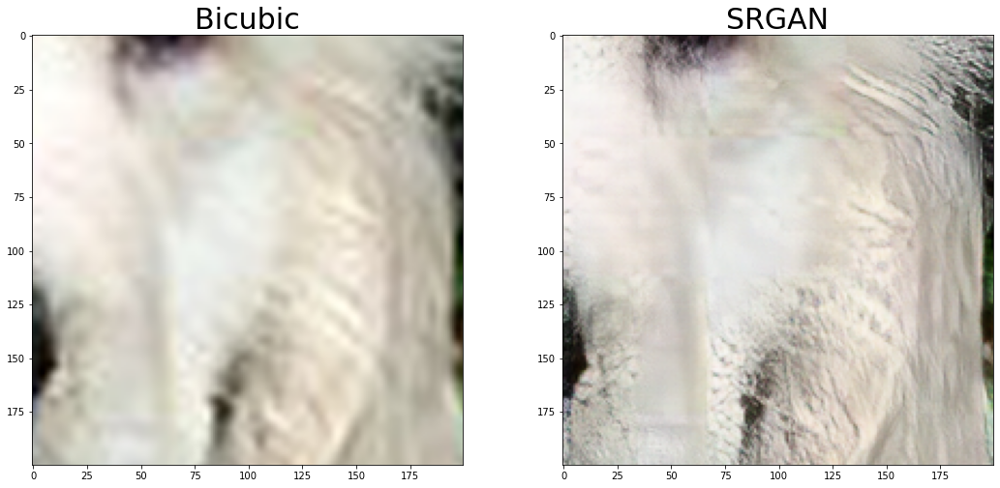

In [84]:
left_top = (400,700)

images = []

img1 = crop(bicubic_image, left_top, 200, 200)
img2 = crop(srgan_image , left_top, 200, 200)
images.extend([img1, img2])

labels = ["Bicubic", "SRGAN"]

plt.figure(figsize=(18,18))
for i in range(2):
    plt.subplot(2,2,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

bicubic에 비해 선명하나, 경계션부분이 갈라지는 것처럼 보입니다. 이 또한 입력된 사진의 정보가 너무 적어서 선명하긴 하지만, 이상한 사진이 출력된 것으로 보입니다.

### 프로젝트 2: SRGAN을 이용해 고해상도 gif 생성하기
-----------------------------------------------------------------------------------------------------------
이전 Super Resolution의 활용 사례에 대해 살펴봤을 때, 단일 이미지가 아닌 영상에 대해 Super Resolution을 적용한 사례가 있었습니다. 이번에는 이미 학습된 SRGAN을 이용해 저해상도 영상을 고해상도 영상으로 바꿔보는 프로젝트를 수행해 봅시다.

실제로 동영상의 Super Resolution은 시간 순서에 따른 다수의 프레임 정보를 고려하는 것이 더 좋지만, 처음부터 학습시키기에 많은 시간이 소요됩니다. 여기서는 이전에 사용했던 SRGAN을 이용해 한 프레임씩 고해상도 이미지로 변환 시켜 모든 프레임에 대해 적용하고, 그 프레임들을 합쳐 동영상으로 만들어 봅시다.

각 프레임들을 모아 gif 파일을 만드는데 아래 라이브러리의 설치가 필요합니다.  
```
$ pip install imageio
``` 

In [85]:
!pip install imageio

### 1. gif 파일 불러오기
-----------------------------------------------------------------------------------------------------------
아래 주소에 몇 개의 gif 파일이 있습니다. 이 중 하나를 골라 다운 로드하여 아래 과정을 수행합시다. (한 개 이상의 gif 파일에 대해 아래 과정을 수행해야 합니다!)  
[GIF files](https://drive.google.com/drive/folders/1OLsa4btdwNUiVJcOJgZe_C6-lwEoNr4e)  
다운받은 gif 파일을 아래와 같은 과정을 통해 각 프레임(이미지)을 불러올 수 있습니다. frames이란 리스트 안에 각각의 프레임이 들어 있습니다.  
```
import cv2

# 다운받은 파일의 경로를 설정해 주세요.
gif = cv2.VideoCapture("저해상도.gif")

isTrue = True
frames = []
while isTrue:
    isTrue, frame = gif.read()
    if isTrue:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)

print("frame 수 :", len(frames))
print("frame 크기 :", (frames[0].shape))
```  

In [86]:
import cv2

# 다운받은 파일의 경로를 설정해 주세요.
gif = cv2.VideoCapture("fire_lr.gif")

isTrue = True
frames = []
while isTrue:
    isTrue, frame = gif.read()
    if isTrue:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)

print("frame 수 :", len(frames))
print("frame 크기 :", (frames[0].shape))

frame 수 : 14
frame 크기 : (282, 300, 3)


### 2. 프레임별 Super Resolution 진행하기
-----------------------------------------------------------------------------------------------------------
Bicubic interpolation과 SRGAN을 이용해 각각의 가로, 세로 픽셀 수를 4배로 늘려봅시다. Super Resolution이 완료된 각각의 결과를 frames_sr이라는 리스트에 넣어주세요.  

In [90]:
frames_sr = []
frames_bi = []
for i in frames:
    frames_bi.append(cv2.resize(i, dsize=(1128, 1200), interpolation=cv2.INTER_CUBIC))
    frames_sr.append(apply_srgan(i))

In [91]:
print(len(frames_sr))

14


### 3. 프레임을 합쳐 gif 만들기
-----------------------------------------------------------------------------------------------------------
위에서 frame_sr을 만들었다면 아래 코드와 같이 gif 파일을 생성할 수 있습니다. Bicubic 및 SRGAN의 결과를 각각 저장하여 2개 파일을 만들어 주세요.
```
import imageio
imageio.mimsave("고해상도.gif", frames_sr)
```  

In [92]:
import imageio
imageio.mimsave("고해상도SR.gif", frames_sr)
imageio.mimsave("고해상도BI.gif", frames_bi)

### 4. Jupyter notebook에 gif 표시하기
-----------------------------------------------------------------------------------------------------------
아래와 같이 다운받은 저해상도 gif 파일과 고해상도 gif 파일을 각각 jupyter 내에 출력하여 최종 제출해 주시면 됩니다. jupyter 내에 출력이 어려운 경우, GitHub에 저해상도, 고해상도 gif파일을 업로드 후 링크를 첨부해주시기바랍니다. Super Resolution이 잘 적용되었는지 시각적으로 확인하기 위해 아래의 width 옵션을 적당히 크게 해주세요. 저해상도 및 고해상도 시각화의 width 값은 같도록 설정해주세요.

```
from IPython.display import Image as show_gif
show_gif("저해상도.gif", width=800) # width 는 적당히 큰 값으로 설정해주세요
show_gif("고해상도.gif", width=800) # 위에서 설정한 width와 같은 값으로 설정해주세요
```

[Low.gif](https://github.com/faithful109/SSAC-X-AIFFEL/blob/master/Low.gif)  
[BI.gif](https://github.com/faithful109/SSAC-X-AIFFEL/blob/master/BI.gif)  
[SR.gif](https://github.com/faithful109/SSAC-X-AIFFEL/blob/master/SR.gif)